In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

print(np.__version__)
print(tf.__version__)
print(cv2.__version__)

1.18.5
2.3.1
4.5.1


In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf

print(np.__version__)
print(tf.__version__)
print(cv2.__version__)
np.random.seed(seed=311)

def load_data(path,size):
    high_res_images = []
    low_res_images = []
    count = 0
    for (dirname, _, filenames_high_res),(dirname, _, filenames_low_res) in zip(os.walk(path+'HIGH'),os.walk(path+'LOW')):
        filenames_high_res.sort()
        filenames_low_res.sort()
        
        for filename_high,filename_low in zip(filenames_high_res,filenames_low_res):
            #faulty image
            
            try:
                count+=1
                img = cv2.imread(os.path.join(dirname, filename_high))
                img_2 = cv2.imread(os.path.join(dirname, filename_low))
                # resizing the images
                width=int(img.shape[1])
                height=int(img.shape[0])
                
                width_2= int(img_2.shape[1])
                height_2=int(img_2.shape[0]) 
            
                if width!= 256 and height !=256:
                    dsize=(512,512)
                    img=cv2.resize(img,dsize)
                  
                if width_2!= 256 and height_2 !=256:
                    dsize=(256,256)
                    dsize_1 = (128,128)
                    img_2 = cv2.resize(img_2,dsize_1,interpolation=cv2.INTER_AREA)
                    img_2 = cv2.resize(img_2,dsize,interpolation=cv2.INTER_AREA)
                    #img_2=cv2.resize(img_2,dsize)
                    img_2 = np.array(img_2)+ np.random.rand(256,256,3)*50
                
                img = process_image(img)
                img_2 = process_image(img_2)
                high_res_images.append(img)
                low_res_images.append(img_2)
            except:
                continue
            if count >size:
                break
    
    # zero-mean and zero-center the standard deviations ....
    low_res_array = np.array(low_res_images)
    #mean_centered_low_res = (low_res_array - low_res_array.mean())/low_res_array.std()
    
    # zero-mean and zero-center the standard deviations .....
    high_res_array = np.array(high_res_images)
    #mean_centered_high_res = (high_res_array - high_res_array.mean())/high_res_array.std()
    
    
    #return mean_centered_low_res, mean_centered_high_res
    return low_res_array,high_res_array

def process_image(image):
    return image/255

1.18.5
2.3.1
4.5.1


In [3]:
base_dir = ''
train_x, train_y =  load_data(path=base_dir+'Training/',size=7000)
val_x, val_y = load_data(path=base_dir+'Validationing/',size=7000)

In [4]:
train_x.shape

(7000, 256, 256, 3)

In [5]:
train_y.shape

(7000, 512, 512, 3)

In [6]:
val_x.shape

(255, 256, 256, 3)

In [7]:
val_y.shape

(255, 512, 512, 3)

In [8]:
np.random.seed(seed=311)

In [ ]:
#train_x+=np.random.rand(train_x.shape[0],train_x.shape[1],train_x.shape[2],train_x.shape[3])*

In [ ]:
train_x[0:1].shape

In [ ]:
val_x.shape

In [ ]:
train_y.shape

In [9]:
# multi-input and output models for probing latent space and for analysing high resolution output
## Convoluional Variational Autoencoderds for Super Resolution
import tensorflow.keras as keras
import tensorflow.keras.layers as layers
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
import tensorflow as tf

# This class creates a sample given a mean and variance - assuming a Gaussian distribution
##########################################################################################
##########################################################################################
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon
##########################################################################################
##########################################################################################

latent_dim = 64
input_shape = (256, 256, 3)

encoder_inputs = keras.Input(shape=input_shape,name='img_input')
#dim_encoding_2 = keras.Input(shape = (latent_dim),name='dim_encode')
#latent_ratio = keras.Input(shape = (1),name='latency_ratio')
l1 = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(encoder_inputs) # input shape 256,256,3
l2 = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l1) #input shape 128,128,64
l2 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l2)
#l2 = Dropout(0.3)(l2)
l3 = layers.Conv2D(128, 3, activation="relu", strides=1, padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l2) # 64,64,64
l4 = layers.Flatten()(l3)
l5 = layers.Dense(256, activation="relu")(l4) # best if this dimension is greater than the latent_dim simension
z_mean = layers.Dense(latent_dim, name="z_mean")(l5)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(l5)


#z_mean = dim_encoding_2*(1-latent_ratio) + z_mean*latent_ratio
z = Sampling()([z_mean, z_log_var])
#encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
#encoder.summary()

#latent_inputs = keras.Input(shape=(latent_dim,))

#l6 = layers.Dense(64 * 64 * 64, activation="relu")(latent_inputs)
l6 = layers.Dense(64 * 64 * 64, activation="relu")(z)
l7 = layers.Reshape((64, 64, 64))(l6) #shape is 64,64,64
l8 = layers.add([l2,l7])
l9 = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l8)
l9 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l9)
#l9 = Dropout(0.3)(l9)
l10 = layers.add([l1,l9])
l11 = layers.Conv2DTranspose(64, 3, activation="relu", strides=1, padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l10) #256,256,64

l12 = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l11) #256,256,32
l12 = Dropout(0.3)(l12)
#l12 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l12)
l13 = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l12) #512,512,32
l13 = Dropout(0.3)(l13)
#l13 = BatchNormalization(axis=-1, momentum=0.9, epsilon=0.001)(l13)
#decoder_outputs = layers.Conv2DTranspose(3, 3, activation="relu", padding="same")(l13) #256,256,3
l14 = layers.Conv2D(16, 3, activation="relu", strides=1,padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l13) #512,512,3
decoder_outputs = layers.Conv2D(3, 3, activation="relu", strides=1,padding="same",bias_initializer='zeros',
                activity_regularizer=regularizers.l1(10e-10),kernel_initializer=tf.compat.v1.keras.initializers.glorot_normal(seed=None,dtype=tf.dtypes.float32))(l14) #256,256,3
#decoder_outputs = tf.slice(decoder_outputs, begin=[0, 0, 0, 0], size=[tf.shape(decoder_outputs)[0], 28, 28, 1])

print(decoder_outputs.shape)
decoder_4 = keras.Model([encoder_inputs],[z_mean,z_log_var,l14,decoder_outputs], name="decoder")
decoder_4.summary()

(None, 512, 512, 3)
Model: "decoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
img_input (InputLayer)          [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 1792        img_input[0][0]                  
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 64, 64, 64)   36928       conv2d[0][0]                     
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 64, 64, 64)   256         conv2d_1[0][0]                   
________________________________________________________________________

In [10]:

def compute_psnr(original_image, generated_image):
    original_image = tf.convert_to_tensor(original_image, dtype = tf.float32)
    generated_image = tf.convert_to_tensor(generated_image, dtype = tf.float32)
    psnr = tf.image.psnr(original_image, generated_image, max_val = 1.0)
    return tf.math.reduce_mean(psnr, axis = None, keepdims = False, name = None)
    

def compute_ssim(original_image, generated_image):
    original_image = tf.convert_to_tensor(original_image, dtype = tf.float32)
    generated_image = tf.convert_to_tensor(generated_image, dtype = tf.float32)
    ssim = tf.image.ssim(original_image, generated_image, max_val = 1.0, filter_size = 11, filter_sigma = 1.5, k1 = 0.01, )
    return tf.math.reduce_mean(ssim, axis = None, keepdims = False, name = None)

In [11]:
### Modifying the train_step
class VAE(keras.Model):
    
    def __init__(self, decoder,compute_psnr,compute_sims, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.decoder = decoder
        self.compute_psnr = compute_psnr
        self.compute_ssim = compute_sims
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")
        self.ssim_tracker = keras.metrics.Mean(name='ssim_loss')
        self.psnr_tracker = keras.metrics.Mean(name='psnr_loss')
        
        self.val_total_loss_tracker = keras.metrics.Mean(name="val_total_loss")
        self.val_reconstruction_loss_tracker = keras.metrics.Mean(name="val_reconstruction_loss")
        self.val_kl_loss_tracker = keras.metrics.Mean(name="val_kl_loss")
        self.val_ssim_tracker = keras.metrics.Mean(name='val_ssim_loss')
        self.val_psnr_tracker = keras.metrics.Mean(name='val_psnr_loss')

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
            self.ssim_tracker,
            self.psnr_tracker
        ]
    
    
    
    def call(self,train_x,train_y=None,training = False):
        if training:
            z_mean,z_log_var,_,reconstruction = self.decoder(train_x) # data is a tuple of encoder_inputs,dim_encoding_2,latent_ratio
        elif (training ==False) & (train_y != None):
            z_mean,z_log_var,d512,reconstruction= self.decoder(train_x)
            return (z_mean,z_log_var,d512,reconstruction)
        else: # training is False and train_y. is None
            print('2.......')
            _,_,_,reconstruction= self.decoder(train_x)
            return reconstruction
        return reconstruction
    
    def train_step(self, data):
        with tf.GradientTape() as tape:
            #print(data)

            train_x,train_y = data
            z_mean,z_log_var,_,reconstruction = self.decoder(train_x) # data is a tuple of encoder_inputs,dim_encoding_2,latent_ratio
            
            reconstruction_loss = tf.keras.losses.MSE(train_y,reconstruction)
            psnr_loss = self.compute_psnr(train_y,reconstruction)
            ssim_loss = self.compute_ssim(train_y,reconstruction)
            
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            #if reconstruction_loss/kl_loss
            total_loss = reconstruction_loss + kl_loss*1e-5
        grads = tape.gradient(total_loss, self.decoder.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.decoder.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        self.ssim_tracker.update_state(ssim_loss)
        self.psnr_tracker.update_state(psnr_loss)
        return {
            "total_loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
            "ssim_loss": self.ssim_tracker.result(),
            "psnr_loss": self.psnr_tracker.result()
        }
    
    def test_step(self,data):
        #print(data)
        if len(list(data)) == 2:  # during validation and training
            trainer_x,trainer_y = data
            z_mean,z_log_var,d512,y_pred = self(trainer_x,trainer_y,training=False)
        else: #during prediction
            data = data
            #fake_data = np.zeros_like(data)
            y_pred = self(train_x=data,train_y=None,training=False)
        #print(y_pred)
        #z_mean,z_log_var,_,reconstruction = self.decoder(data)
        reconstruction_loss = tf.keras.losses.MSE(trainer_y,y_pred)
        psnr_loss = self.compute_psnr(trainer_y,y_pred)
        ssim_loss = self.compute_ssim(trainer_y,y_pred)
            
        kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
        kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
        total_loss = reconstruction_loss + kl_loss*1e-5
        self.val_total_loss_tracker.update_state(total_loss)
        self.val_reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.val_kl_loss_tracker.update_state(kl_loss)
        self.val_ssim_tracker.update_state(ssim_loss)
        self.val_psnr_tracker.update_state(psnr_loss)
        return {"val_total_loss": self.val_total_loss_tracker.result(),
            "val_reconstruction_loss": self.val_reconstruction_loss_tracker.result(),
            "val_kl_loss": self.val_kl_loss_tracker.result(),
            "val_ssim_loss": self.val_ssim_tracker.result(),
            "val_psnr_loss": self.val_psnr_tracker.result()
            }
    
    #def predict_step(self,data):
        
    

model_15 = VAE(decoder_4,compute_psnr,compute_ssim)
model_15.compile(optimizer=keras.optimizers.Adam(1e-5),loss=None)

In [ ]:
history_20= model_15.fit(train_x, train_y, validation_data =(val_x , val_y),epochs = 100, batch_size = 12, shuffle = True)

Epoch 1/100
584/584 [==============================] - 396s 679ms/step - total_loss: 0.1168 - reconstruction_loss: 0.1162 - kl_loss: 58.9706 - ssim_loss: 0.0677 - psnr_loss: 10.4581 - val_val_total_loss: 0.0497 - val_val_reconstruction_loss: 0.0497 - val_val_kl_loss: 0.2794 - val_val_ssim_loss: 0.1080 - val_val_psnr_loss: 13.3697
Epoch 2/100
584/584 [==============================] - 392s 671ms/step - total_loss: 0.0485 - reconstruction_loss: 0.0485 - kl_loss: 0.0471 - ssim_loss: 0.2562 - psnr_loss: 13.8036 - val_val_total_loss: 0.0447 - val_val_reconstruction_loss: 0.0447 - val_val_kl_loss: 0.1399 - val_val_ssim_loss: 0.2280 - val_val_psnr_loss: 13.8466
Epoch 3/100
584/584 [==============================] - 391s 670ms/step - total_loss: 0.0430 - reconstruction_loss: 0.0430 - kl_loss: 0.0383 - ssim_loss: 0.3556 - psnr_loss: 14.4689 - val_val_total_loss: 0.0410 - val_val_reconstruction_loss: 0.0410 - val_val_kl_loss: 0.1071 - val_val_ssim_loss: 0.2790 - val_val_psnr_loss: 14.2682
Epoch 

In [11]:
zeezee= model_14.predict(val_x)

2.......


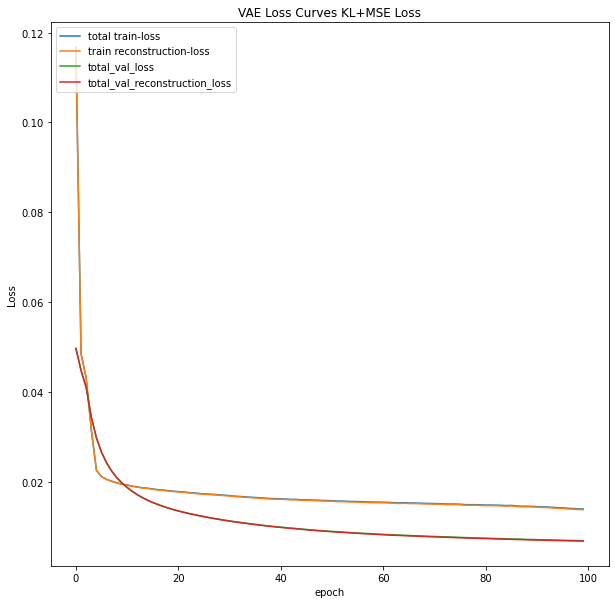

In [21]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_20.history['total_loss'])
plt.plot(history_20.history['reconstruction_loss'])
plt.plot(history_20.history['val_val_total_loss'])
plt.plot(history_20.history['val_val_reconstruction_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['total train-loss', 'train reconstruction-loss', 'total_val_loss', 'total_val_reconstruction_loss'], loc='upper left')
plt.show()

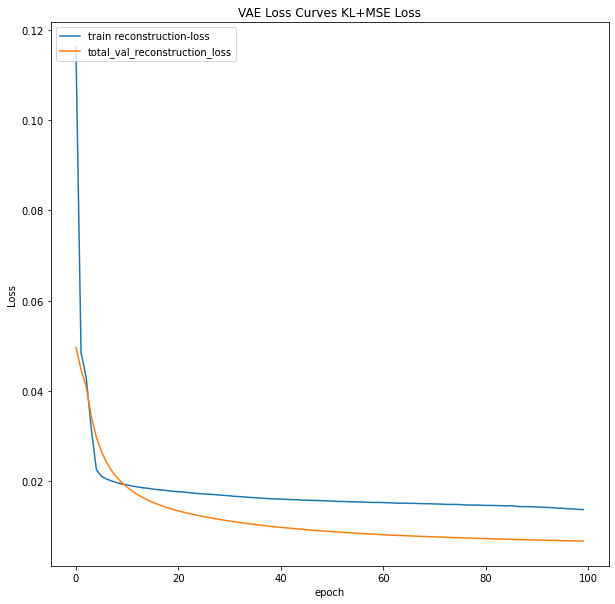

In [28]:
plt.rcParams["figure.figsize"] = (10,10)
#plt.plot(history_20.history['total_loss'])
plt.plot(history_20.history['reconstruction_loss'])
#plt.plot(history_20.history['val_val_total_loss'])
plt.plot(history_20.history['val_val_reconstruction_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train reconstruction-loss', 'total_val_reconstruction_loss'], loc='upper left')
plt.show()

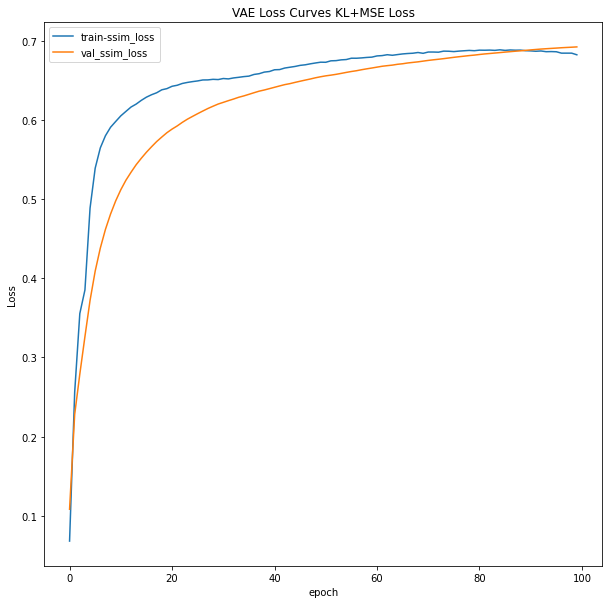

In [22]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_20.history['ssim_loss'])
plt.plot(history_20.history['val_val_ssim_loss'])
#plt.plot(history_12.history['psnr_loss'])
#plt.plot(history_12.history['val_val_psnr_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train-ssim_loss', 'val_ssim_loss', 'train_psnr_loss', 'val_psnr_loss'], loc='upper left')
plt.show()

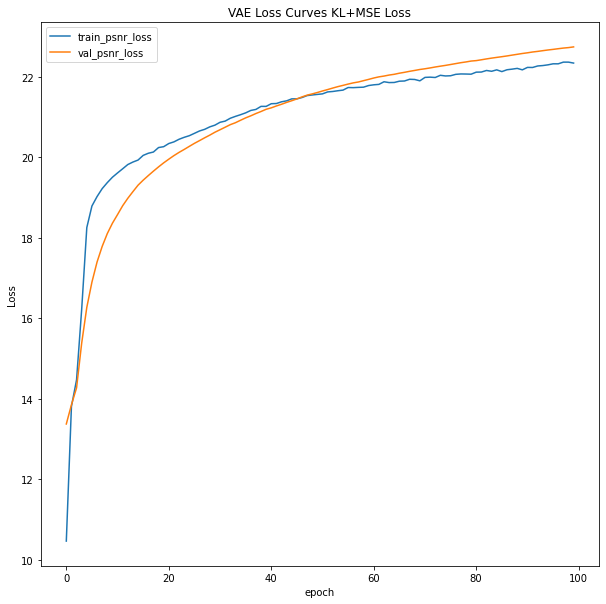

In [23]:
plt.rcParams["figure.figsize"] = (10,10)
# plt.plot(history_12.history['ssim_loss'])
# plt.plot(history_12.history['val_val_ssim_loss'])
plt.plot(history_20.history['psnr_loss'])
plt.plot(history_20.history['val_val_psnr_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train_psnr_loss', 'val_psnr_loss'], loc='upper left')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


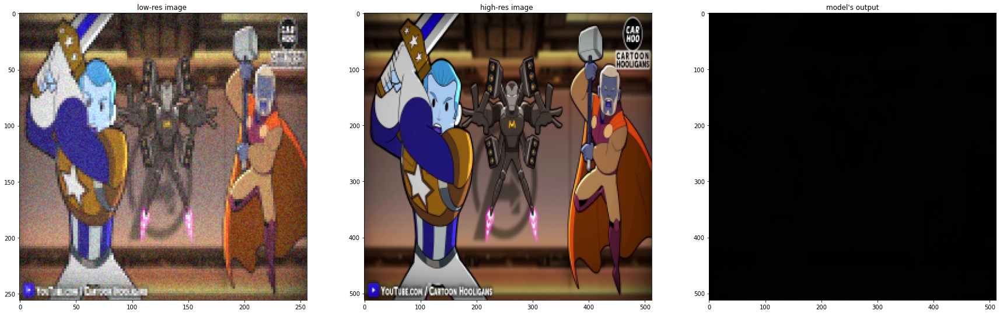

<Figure size 2880x2880 with 0 Axes>

In [12]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[100])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[100])
ax2.title.set_text("high-res image ")
ax3.imshow(zeezee[100])
ax3.title.set_text("model's output")

In [ ]:
model_15.save('VAE_5_DropOut_BN_512_final_MSE_KL_SIMS_PSNR_best_best')

2.......
2.......
2.......
2.......
INFO:tensorflow:Assets written to: VAE_5_DropOut_BN_512_final_MSE_KL_SIMS_PSNR_best_best/assets


In [15]:
tee= model_15.predict(val_x)

2.......


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


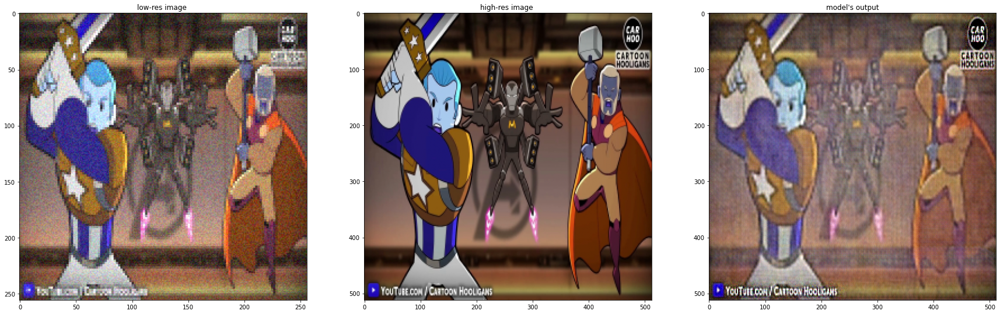

<Figure size 2880x2880 with 0 Axes>

In [16]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[100])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[100])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[100])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


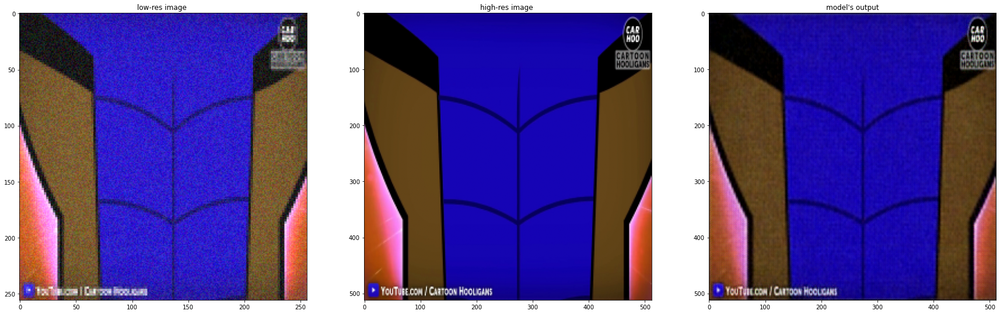

<Figure size 2880x2880 with 0 Axes>

In [18]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[200])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[200])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[200])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


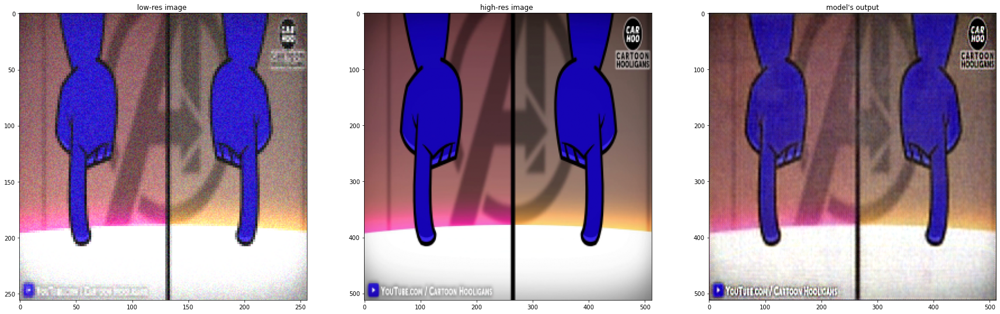

<Figure size 2880x2880 with 0 Axes>

In [19]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[250])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[250])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[250])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


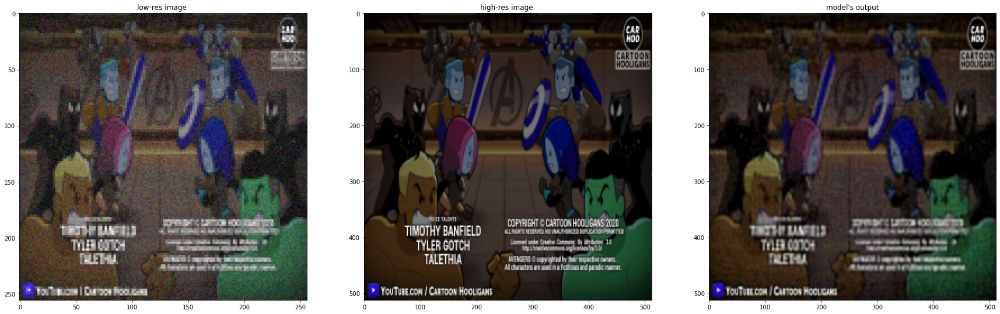

<Figure size 2880x2880 with 0 Axes>

In [20]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[50])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[50])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[50])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


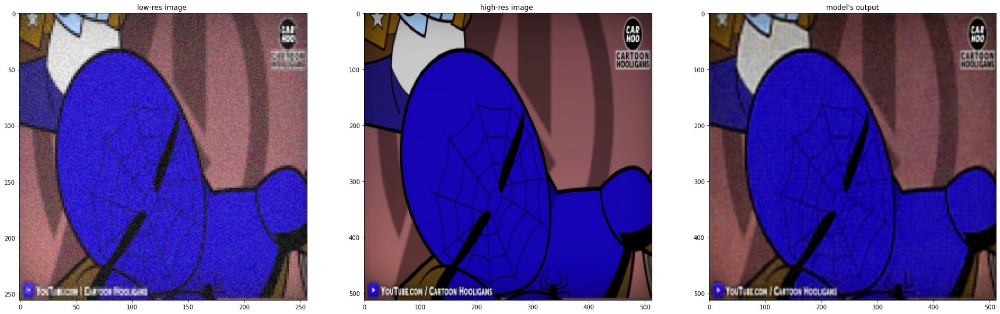

<Figure size 2880x2880 with 0 Axes>

In [24]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[1])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[1])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[1])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


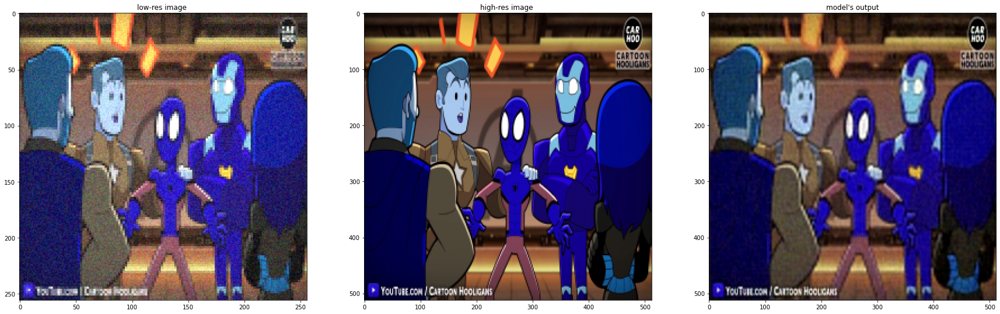

<Figure size 2880x2880 with 0 Axes>

In [25]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[20])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[20])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[20])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


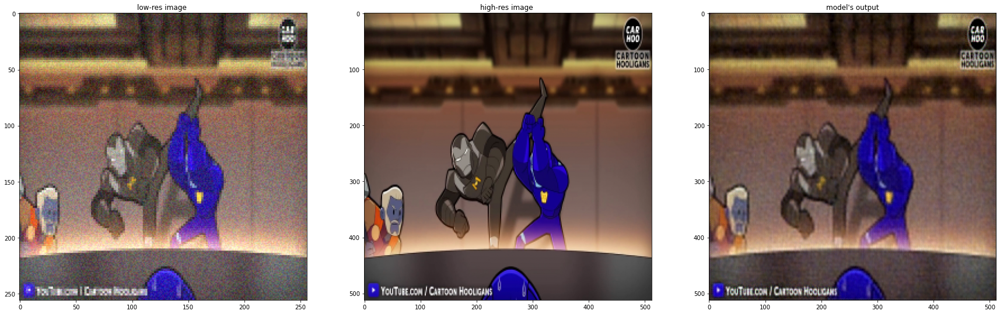

<Figure size 2880x2880 with 0 Axes>

In [26]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[80])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[80])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[80])
ax3.title.set_text("model's output")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


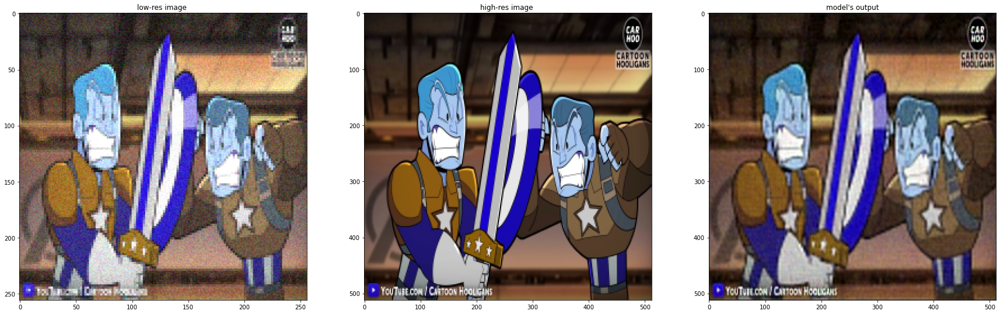

<Figure size 2880x2880 with 0 Axes>

In [27]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[120])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[120])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[120])
ax3.title.set_text("model's output")

In [ ]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_20.history['total_loss'])
plt.plot(history_12.history['reconstruction_loss'])
plt.plot(history_12.history['val_val_total_loss'])
plt.plot(history_12.history['val_val_reconstruction_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['total train-loss', 'train reconstruction-loss', 'total_val_loss', 'total_val_reconstruction_loss'], loc='upper left')
plt.show()

In [6]:
import tensorflow.keras as keras
import tensorflow.keras.layers as layers
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, UpSampling2D, add, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
import tensorflow as tf
reuploaded_model = tf.keras.models.load_model('VAE_4_DropOut_BN_512_final_MSE_KL_SIMS_PSNR_best')

In [8]:
val_x.shape

(255, 256, 256, 3)

In [9]:
val_predict = np.array([(x,y) for x,y in zip(val_x,val_y)])

In [13]:
val_predict.shape

(255, 2)

In [11]:
val_predict[0].shape

(2,)

In [14]:
tee= reuploaded_model.predict(val_x)

ValueError: in user code:

    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:1462 predict_function  *
        return step_function(self, iterator)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:1452 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/distribute/distribute_lib.py:1211 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/distribute/distribute_lib.py:2585 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/distribute/distribute_lib.py:2945 _call_for_each_replica
        return fn(*args, **kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:1445 run_step  **
        outputs = model.predict_step(data)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/engine/training.py:1418 predict_step
        return self(x, training=False)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/engine/base_layer.py:985 __call__
        outputs = call_fn(inputs, *args, **kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/saving/saved_model/utils.py:71 return_outputs_and_add_losses
        outputs, losses = fn(inputs, *args, **kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/saving/saved_model/utils.py:170 wrap_with_training_arg
        lambda: replace_training_and_call(False))
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/utils/tf_utils.py:65 smart_cond
        pred, true_fn=true_fn, false_fn=false_fn, name=name)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/framework/smart_cond.py:56 smart_cond
        return false_fn()
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/saving/saved_model/utils.py:170 <lambda>
        lambda: replace_training_and_call(False))
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/keras/saving/saved_model/utils.py:165 replace_training_and_call
        return wrapped_call(*args, **kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/eager/def_function.py:780 __call__
        result = self._call(*args, **kwds)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/eager/def_function.py:814 _call
        results = self._stateful_fn(*args, **kwds)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/eager/function.py:2828 __call__
        graph_function, args, kwargs = self._maybe_define_function(args, kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/eager/function.py:3213 _maybe_define_function
        graph_function = self._create_graph_function(args, kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/eager/function.py:3075 _create_graph_function
        capture_by_value=self._capture_by_value),
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/framework/func_graph.py:986 func_graph_from_py_func
        func_outputs = python_func(*func_args, **func_kwargs)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/eager/def_function.py:600 wrapped_fn
        return weak_wrapped_fn().__wrapped__(*args, **kwds)
    /home/ec2-user/anaconda3/envs/tensorflow2_p36/lib/python3.6/site-packages/tensorflow/python/saved_model/function_deserialization.py:257 restored_function_body
        "\n\n".join(signature_descriptions)))

    ValueError: Could not find matching function to call loaded from the SavedModel. Got:
      Positional arguments (2 total):
        * Tensor("data:0", shape=(None, 256, 256, 3), dtype=float32)
        * False
      Keyword arguments: {}
    
    Expected these arguments to match one of the following 4 option(s):
    
    Option 1:
      Positional arguments (2 total):
        * (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_1'), TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name='input_2'))
        * False
      Keyword arguments: {}
    
    Option 2:
      Positional arguments (2 total):
        * (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='data/0'), TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name='data/1'))
        * False
      Keyword arguments: {}
    
    Option 3:
      Positional arguments (2 total):
        * (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='data/0'), TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name='data/1'))
        * True
      Keyword arguments: {}
    
    Option 4:
      Positional arguments (2 total):
        * (TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name='input_1'), TensorSpec(shape=(None, 512, 512, 3), dtype=tf.float32, name='input_2'))
        * True
      Keyword arguments: {}


In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(30,30))
plt.figure(figsize=(40,40))
ax1.imshow(val_x[100])
ax1.title.set_text("low-res image ")
ax2.imshow(val_y[100])
ax2.title.set_text("high-res image ")
ax3.imshow(tee[3][100])
ax3.title.set_text("model's output")

In [18]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_12.history['total_loss'])
plt.plot(history_12.history['reconstruction_loss'])
plt.plot(history_12.history['val_val_total_loss'])
plt.plot(history_12.history['val_val_reconstruction_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['total train-loss', 'train reconstruction-loss', 'total_val_loss', 'total_val_reconstruction_loss'], loc='upper left')
plt.show()

NameError: name 'history_12' is not defined

In [ ]:
plt.rcParams["figure.figsize"] = (10,10)
plt.plot(history_12.history['ssim_loss'])
plt.plot(history_12.history['val_val_ssim_loss'])
#plt.plot(history_12.history['psnr_loss'])
#plt.plot(history_12.history['val_val_psnr_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train-ssim_loss', 'val_ssim_loss', 'train_psnr_loss', 'val_psnr_loss'], loc='upper left')
plt.show()

In [ ]:
plt.rcParams["figure.figsize"] = (10,10)
# plt.plot(history_12.history['ssim_loss'])
# plt.plot(history_12.history['val_val_ssim_loss'])
plt.plot(history_12.history['psnr_loss'])
plt.plot(history_12.history['val_val_psnr_loss'])
#plt.plot(history_5.history['kl_loss'][1:])
plt.title('VAE Loss Curves KL+MSE Loss')
plt.ylabel('Loss')
plt.xlabel('epoch')
plt.legend(['train_psnr_loss', 'val_psnr_loss'], loc='upper left')
plt.show()